In [1]:
import os
import re

import pandas as pd
import numpy as np
from sklearn.manifold import TSNE

import fasttext
from iso639 import languages
import gensim
from gensim.models.keyedvectors import KeyedVectors

import altair as alt

In [2]:
alt.data_transformers.enable('default', max_rows=None)

DataTransformerRegistry.enable('default')

## Loading csvs and model

In [3]:
mod = KeyedVectors.load("word2vecmodels/docs_grams_final.model")

In [4]:
df = pd.DataFrame(mod.index_to_key, columns=["d2vtag"])

We reduce the dimensionality of the doc2vec representation with TSNE

In [5]:
xy_tsne = TSNE(n_components=2,n_jobs=-1,random_state=42).fit_transform(mod.vectors)

In [6]:
df[["TSNE_x", "TSNE_y"]] = xy_tsne

In [7]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=4, random_state=42,n_jobs=-1).fit(xy_tsne)
df["lab"] = kmeans.labels_

/home/toccasana/anaconda3/envs/env_master/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:792: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


In [8]:
from sklearn.cluster import DBSCAN
clustering = DBSCAN(eps=3, min_samples=2,n_jobs=-1).fit(xy_tsne)
df["db_lab"] = clustering.labels_

In [9]:
dataset = pd.read_csv("songlyrics/songs_with_filenames_and_feats_5.csv", delimiter=";")
dataset = dataset[dataset['filename'].notna()]

We add the new data to the other features

In [10]:
joined = dataset.set_index('filename').join(df.set_index('d2vtag')).reset_index()

In [11]:
joined.head()

,index,id,tag_fimi,publisher,album_release_date,album_type,song_name,album_id,artists_names,artists_id,...,instrumentalness,liveness,valence,tempo,type,duration_ms,TSNE_x,TSNE_y,lab,db_lab
0,# fuori c'è il sole_Lorenzo Fragola.txt,2lCT4RVgR0bIYR0JW7Mcqx,sony music,sme,2015-03-31,album,# fuori c'è il sole,0jDgMZrhUnBCPTH0W9sxRD,['Lorenzo Fragola'],['0tTS475qIqv3KXYZMXjsYy'],...,0.000000,0.4380,0.612,91.011,audio_features,4,-22.561802,-35.020302,2,0
1,#SELFIE_The Chainsmokers.txt,1HOlb9rdNOmy9b1Fakicjo,republic,uni,2014-01-01,single,#SELFIE,3OeA4rJ9XJNAygyNyTc2sI,['The Chainsmokers'],['69GGBxA162lTqCwzJG5jLp'],...,0.000008,0.0770,0.658,127.956,audio_features,4,16.283884,17.884787,1,1
2,#thatPOWER_will.i.am.txt,01TuObJVd7owWchVRuQbQw,uni,NaN,2013-01-01,album,#thatPOWER,0VWYRbEcvJcPrqMGJirO6q,"['will.i.am', 'Justin Bieber']","['085pc2PYOi8bGKj0PNjekA', '1uNFoZAHBGtllmzznp...",...,0.000077,0.0748,0.402,127.999,audio_features,4,39.929226,5.610235,1,1
3,$€ Freestyle_Sfera Ebbasta.txt,3CS7Wr2Hzqoh2f2iHXxiIa,island,uni,2020-12-18,album,$€ Freestyle,27EhxNeyTwvnuo0TcWMDZf,['Sfera Ebbasta'],['23TFHmajVfBtlRx5MXqgoz'],...,0.000000,0.3760,0.380,136.079,audio_features,4,-37.262955,30.683184,3,0
4,'O scarrafone - 2021 Remaster_Pino Daniele.txt,6Kwd79Jc6kAI4qsJooqWoX,cgd/eastwest italy,wmi,1991-04-18,album,'O scarrafone - 2021 Remaster,2J86Xdu7KTyNGNHVnWgf2y,['Pino Daniele'],['2eFv7NVs8R6Go7msuqikeg'],...,0.030300,0.0547,0.718,104.997,audio_features,4,-10.247525,-39.389530,0,4


## Features engineering

Adding the name of the first song of each artist as a feature

In [12]:
firstart = []
for artist in joined["artists_names"]:
    firstart.append(eval(artist)[0])
joined["firstart"] = firstart

Adding the year of publication of each song

In [13]:
joined['year'] = pd.DatetimeIndex(joined['album_release_date']).year

Using fasttext pretrained model for detecting a given song's language

In [14]:
PRETRAINED_MODEL_PATH = 'fastext_models/lid.176.bin'
model = fasttext.load_model(PRETRAINED_MODEL_PATH)
#model.predict("ciao how are you come stai italiano")

In [15]:
DATA = "songlyrics/lyrics"

In [16]:
langs= list()
intros = list()
for song in joined["index"]:
    with open(os.path.join(DATA,song),"r",encoding='utf-8') as file:
        lyrics = file.read()
        lyrics = re.sub("\n"," ",lyrics)
        intros.append(lyrics[:400])
        fasttex_pred = model.predict(lyrics)[0][0][9:]
        try:
            code = languages.get(alpha2=fasttex_pred).name
        except:
            code = languages.get(part3=fasttex_pred).name
        finally:
            langs.append(code)

Adding the song language and a snipped of its lyrics to the dataset

In [17]:
joined["lang"] = langs
joined["intros"] = intros

In [18]:
joined.loc[joined["db_lab"] == 4,"lang"] = "Neapolitan"

In [19]:
langdict = joined[["id","lang"]].set_index("id").to_dict()["lang"]

In [20]:
full_df = pd.read_csv("songlyrics/cleaned_df_v5.csv", delimiter=";", parse_dates=True, infer_datetime_format=True)

In [21]:
full_df["lang"] = full_df["id"].map(langdict)

In [22]:
full_df

,original_song_name,original_artists_name,curr_rank,tag_fimi,publisher,date_chart,song_id,album_release_date,album_type,song_name,...,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature,lang
0,svegliarsi la mattina,zero assoluto,1,sgo,NaN,2006-05-07,0,2006-02-28,single,Svegliarsi la mattina,...,0.607,171.970,audio_features,1ecMdfIXNksJTymYlzsFZ3,https://api.spotify.com/v1/tracks/1ecMdfIXNksJ...,https://api.spotify.com/v1/audio-analysis/1ecM...,223053,4,NaN,Italian
1,svegliarsi la mattina,zero assoluto,3,sgo,NaN,2006-05-14,0,2006-02-28,single,Svegliarsi la mattina,...,0.607,171.970,audio_features,1ecMdfIXNksJTymYlzsFZ3,https://api.spotify.com/v1/tracks/1ecMdfIXNksJ...,https://api.spotify.com/v1/audio-analysis/1ecM...,223053,4,NaN,Italian
2,svegliarsi la mattina,zero assoluto,3,sgo,NaN,2006-05-21,0,2006-02-28,single,Svegliarsi la mattina,...,0.607,171.970,audio_features,1ecMdfIXNksJTymYlzsFZ3,https://api.spotify.com/v1/tracks/1ecMdfIXNksJ...,https://api.spotify.com/v1/audio-analysis/1ecM...,223053,4,NaN,Italian
3,svegliarsi la mattina,zero assoluto,4,sgo,NaN,2006-05-28,0,2006-02-28,single,Svegliarsi la mattina,...,0.607,171.970,audio_features,1ecMdfIXNksJTymYlzsFZ3,https://api.spotify.com/v1/tracks/1ecMdfIXNksJ...,https://api.spotify.com/v1/audio-analysis/1ecM...,223053,4,NaN,Italian
4,svegliarsi la mattina,zero assoluto,4,sgo,NaN,2006-06-04,0,2006-02-28,single,Svegliarsi la mattina,...,0.607,171.970,audio_features,1ecMdfIXNksJTymYlzsFZ3,https://api.spotify.com/v1/tracks/1ecMdfIXNksJ...,https://api.spotify.com/v1/audio-analysis/1ecM...,223053,4,NaN,Italian
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64407,boy,baby gang & bobo feat. rondodasosa,76,wm italy,warner music,2021-05-20,5858,1979-05-11,album,Boys Don't Cry,...,0.671,168.766,audio_features,1QFh8OH1e78dGd3VyJZCAC,spotify:track:1QFh8OH1e78dGd3VyJZCAC,https://api.spotify.com/v1/tracks/1QFh8OH1e78d...,https://api.spotify.com/v1/audio-analysis/1QFh...,155973,4.0,English
64408,cabriolet panorama,the kolors,79,island,uni,2021-05-20,5859,2021-04-29,single,Cabriolet Panorama,...,0.746,116.012,audio_features,4lajqBJavxKL3sllt1TcTH,https://api.spotify.com/v1/tracks/4lajqBJavxKL...,https://api.spotify.com/v1/audio-analysis/4laj...,178448,4,NaN,Italian
64409,rapina,baby gang feat. neima ezza,88,wm italy,warner music,2021-05-20,5860,2021-05-14,album,Rapina (feat. Neima Ezza),...,0.421,77.653,audio_features,6DQeNYWn9lbwxeYAXzu7IE,https://api.spotify.com/v1/tracks/6DQeNYWn9lbw...,https://api.spotify.com/v1/audio-analysis/6DQe...,274458,3,NaN,Italian
64410,rasputin,majestic & boney m.,90,nitron music,sme,2021-05-20,5861,1978,album,Rasputin,...,0.966,126.143,audio_features,5jkFvD4UJrmdoezzT1FRoP,spotify:track:5jkFvD4UJrmdoezzT1FRoP,https://api.spotify.com/v1/tracks/5jkFvD4UJrmd...,https://api.spotify.com/v1/audio-analysis/5jkF...,351573,4.0,English


In [23]:
full_df.to_csv("cleaned_df_v5_with_langs.csv",sep=";",index=False)

In [24]:
lang_counts = full_df.groupby(["date_chart","lang"]).size().unstack(fill_value=0)
lang_counts = lang_counts.div(lang_counts.sum(axis=1), axis=0).reset_index()

In [25]:
lang_counts.to_csv("langs.csv", sep=";", index=False)

In [26]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

import ast
import seaborn as sns
import altair as alt
from statsmodels.tsa.seasonal import seasonal_decompose
import datetime
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

from collections import defaultdict

In [27]:
lang_counts['date_chart'] = pd.to_datetime(lang_counts['date_chart'], format= '%Y-%m-%d')

In [28]:
lang_counts = lang_counts.set_index("date_chart")

In [29]:
langs = [lang_counts['English'], lang_counts['Italian'], lang_counts['Spanish'], lang_counts['Neapolitan']]
langs = list(map(lambda x : (x.name, x.resample("M").mean()),langs))
trens = list(map(lambda x : (x[1].name, seasonal_decompose(x[1]).trend),langs))

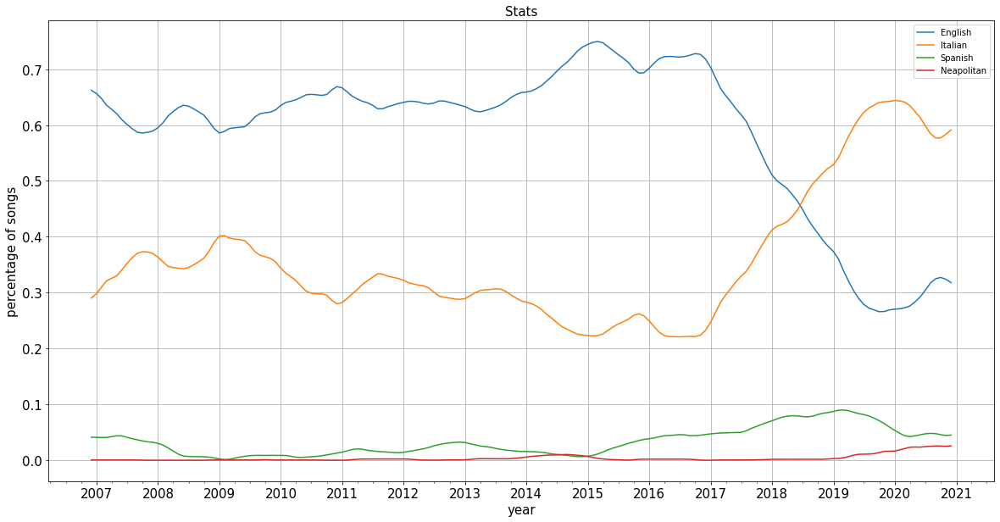

In [35]:
fig, ax = plt.subplots(figsize=(20,10))
ax.grid(True)

year = mdates.YearLocator(month=1)
month = mdates.MonthLocator(interval=3)

ax.xaxis.set_minor_locator(month)
ax.xaxis.set_major_locator(year)

for lan in trens: 
    plt.plot(lan[1], label=lan[0])
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.legend(loc='best')

ax.set_title("Stats", fontsize=15)
ax.set_xlabel("year", fontsize=15)
ax.set_ylabel("percentage of songs", fontsize=15)

plt.savefig("langs_time.png", dpi=300)

plt.show()

In [31]:
joined.to_csv("songs_with_filenames_and_feats_and_lang_5.csv", sep=";", index=False)

## Plotting the doc2vec representation with Altair

In [109]:
points = alt.Chart(joined).mark_circle(
    opacity=0.8,
    size=100
).encode(
    x='TSNE_x',
    y='TSNE_y',
    tooltip=["song_name", "artists_names", "album_release_date", "tag_fimi","publisher","album_release_date", "lang", "intros"],
    color=alt.Color('lang:N')
)
al = points
al.interactive().properties(
    width=1280,
    height=720
)

alt.Chart(...)

In [111]:
al.interactive().properties(
    width=1280,
    height=720
).save('tsne.html')

In [117]:
points = alt.Chart(pd.DataFrame(joined.lang.value_counts().iloc[:4],columns=["lang"]).reset_index()).mark_bar(
    opacity=0.8
).encode(
    y = alt.Y('index', sort="-x", title="language"),
    x = alt.X('lang',title="count of songs"),
    color = "index"
    )
al = points
al.properties(
    width=800,
    height=500
).save('counts.html')

In [26]:
points = alt.Chart(joined).mark_circle(
    opacity=0.8,
    size=100
).encode(
    x='TSNE_x',
    y='TSNE_y',
    tooltip=["song_name", "artists_names", "album_release_date", "tag_fimi","publisher","album_release_date", "lang", "intros", "lab", "db_lab"],
    color="lang:N"
)
'''
text = points.mark_text(
    align='left',
    baseline='middle',
    dx=7
).encode(
    text='publisher'
)
'''
al = points# + text
al.interactive().properties(
    width=1920,
    height=1080
)

alt.Chart(...)

In [192]:
defective = pd.concat([joined[joined["db_lab"] == 2], joined[joined["db_lab"] == 3]])

In [193]:
defective.head()

,index,id,tag_fimi,publisher,album_release_date,album_type,song_name,album_id,artists_names,artists_id,...,type,duration_ms,TSNE_x,TSNE_y,lab,db_lab,firstart,year,lang,intros
175,Aiysha_Khaled.txt,6EbXToKgsxISGvQMl1RnS5,sbm,NaN,1999,album,Aiysha,1MVl8O83hm6FmFYJk7EyPA,['Khaled'],['28ztjHIXceRRntmTUfnmUX'],...,audio_features,4.0,-22.057592,44.488922,0,2,Khaled,1999,English,"Last updated: 10/6/2018, 5:16PM MSTOctoberOcto..."
494,Bassotto_Dark Polo Gang.txt,0uwW1Duv6xlk2bNutlc7tu,tanta roba label / island,uni,2019-10-24,single,Bassotto,0R0BBl4QOVWTyHrOgoI2Ud,"['Dark Polo Gang', 'Tony Effe']","['4CuMwzDzEdlUJMEna38VQ0', '6CKch2otN4SPznHf9m...",...,audio_features,4.0,-22.175060,45.503677,0,2,Dark Polo Gang,2019,English,"4/1 BTS - ""Film out"" ​chloe moriondo - ""I Eat ..."
892,Chica_Vittorio Gucci.txt,2YqEIgQy35PXpI2syibH11,NaN,NaN,2008-07-02,compilation,Chica,7cOyBEvRve6q7TqcTS96fq,['Vittorio Gucci'],['3WxLzDQcnoDf85RdY24Qsi'],...,audio_features,4.0,-22.138123,45.509182,0,2,Vittorio Gucci,2008,English,"10/1 Ant Clemons - ""4 Letter Word"" ft. Timbala..."
1155,Dance Monkey (8D Audio)_8D Tunes.txt,4KgAFt6Tt4E96poxgq5dVJ,sto records/atlantic,wmi,2020-01-24,album,Dance Monkey (8D Audio),6pQtc8JG1JUvqGpOSC3yuu,['8D Tunes'],['5fOzKeaM5PmZ2BcKKAtFeq'],...,audio_features,4.0,-20.440094,46.371834,0,2,8D Tunes,2020,French,Janvier : - 01/01 : Makiavel - Diplomatico - 0...
1168,Danza Kuduro_Alejandro Crespo.txt,7JsDTMAEJcvIvaAAjxMx6J,car,NaN,2011-05-10,single,Danza Kuduro,09o93dYH5UUczlRzcjDU1s,['Alejandro Crespo'],['4kY3Ty5pdN2k3WPNbie6Ht'],...,audio_features,4.0,-18.869425,48.613403,0,2,Alejandro Crespo,2011,English,825 ALL NIGHT – PAROV STELAR 824 BIG JET PLANE...


In [194]:
defective = defective[["id", "song_name", "artists_names"]]
defective["song_name_less"] = defective["song_name"].str.replace(r"(-.+|\(.+\))", "")

<ipython-input-194-e4dbe52a73d0>:2: FutureWarning: The default value of regex will change from True to False in a future version.
  defective["song_name_less"] = defective["song_name"].str.replace(r"(-.+|\(.+\))", "")


In [195]:
defective.to_csv("defective_cluster.csv", index=False, sep=";")